[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/sophiajw/HistAuGAN/blob/master/HistAuGAN.ipynb)

# HistAuGAN demo

Demo notebook for the GAN-based augmentation technique presented in "Structure-Preserving Multi-Domain Stain Color Augmentation using Style-Transfer with Disentangled Representations" accepted at MICCAI 2021.

Run the two cells below to set up the colab notebook.

In [1]:
!git clone https://github.com/sophiajw/HistAuGAN.git
%cd HistAuGAN

fatal: destination path 'HistAuGAN' already exists and is not an empty directory.
/datasets/_deepnote_work/HistAuGAN


In [4]:
!pip install gdown

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.3/187.3 kB 22.9 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [7]:
import sys
import os

# Add the directory containing augmentations.py to the Python path
sys.path.append(os.getcwd())


# Add the histaugan directory to the Python path
sys.path.append(os.path.join(os.getcwd(), 'histaugan'))

In [10]:
# load model weights from https://drive.google.com/file/d/1uObebkPgx_q6cZznGaUps-RfoSrUhNnD/view?usp=sharing
!gdown https://drive.google.com/uc?id=1uObebkPgx_q6cZznGaUps-RfoSrUhNnD

Downloading...
From (original): https://drive.google.com/uc?id=1uObebkPgx_q6cZznGaUps-RfoSrUhNnD
From (redirected): https://drive.google.com/uc?id=1uObebkPgx_q6cZznGaUps-RfoSrUhNnD&confirm=t&uuid=4798ec86-5a3e-4ff7-8680-29151bb76f50
To: /datasets/_deepnote_work/HistAuGAN/gan_weights.pth
100%|█████████████████████████████████████████| 565M/565M [00:05<00:00, 111MB/s]


In [13]:
%load_ext autoreload
%autoreload 2

import torch
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from PIL import Image

from augmentations import generate_hist_augs, opts, mean_domains, std_domains
from histaugan.model import MD_multi

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

/root/venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## HistAuGAN on Camelyon17 Dataset

### Visualize sample patches

We selected five patches per medical domain in Camelyon17 to demonstrate the image synthesis of HistAuGAN. The patches were selected manually to ensure a wide variety of colors, cell sizes, and histological structures for each domain.

In [41]:
# add correct path to directory with sample tiles (5 images per domain, hence in total 25 tiles)
tiles_dir = 'sample_tiles/'
tile_names = os.listdir(tiles_dir)
tile_names.sort()
if '.ipynb_checkpoints' in tile_names:
    tile_names.pop(0)
print(tile_names)

['domain_0_15018.pt', 'domain_0_17628.pt', 'domain_0_4270.pt', 'domain_0_7810.pt', 'domain_0_8327.pt', 'domain_1_12919.pt', 'domain_1_20602.pt', 'domain_1_2680.pt', 'domain_1_701.pt', 'domain_1_8708.pt', 'domain_2_14011.pt', 'domain_2_1951.pt', 'domain_2_4194.pt', 'domain_2_7596.pt', 'domain_2_8779.pt', 'domain_3_10995.pt', 'domain_3_12295.pt', 'domain_3_24502.pt', 'domain_3_25596.pt', 'domain_3_31677.pt', 'domain_4_11631.pt', 'domain_4_14810.pt', 'domain_4_17868.pt', 'domain_4_6264.pt', 'domain_4_9876.pt']


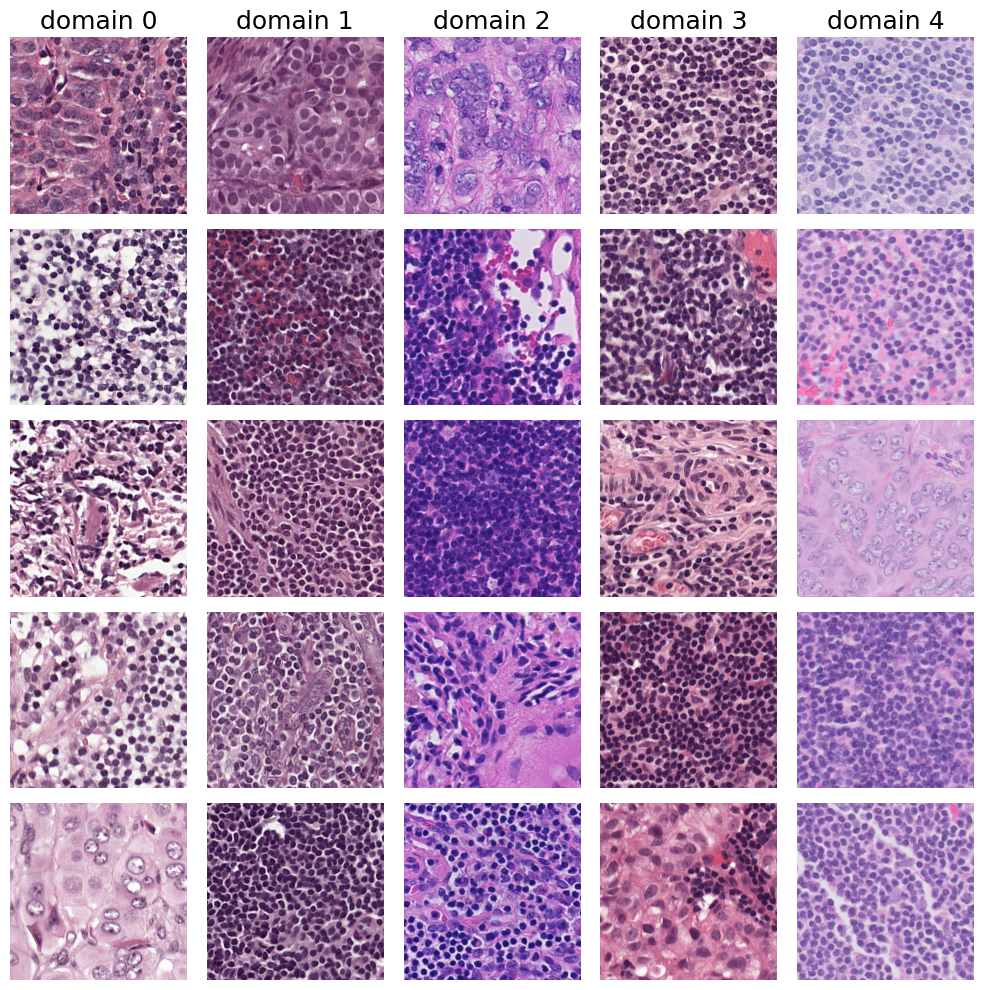

In [44]:
# plot all images
rows, columns, img_size = 5, 5, 2

plt.figure(figsize=(columns * img_size, rows * img_size))
for i in range(rows * columns):
    img = torch.load(tiles_dir + tile_names[i])

    plt.subplot(rows, columns, (i % columns) * columns + (i // columns) + 1)
    plt.imshow(img.permute(1, 2, 0))
    if i % 5 == 0:
        plt.title(f'domain {i // 5}', fontsize=18)
    plt.axis('off')
plt.tight_layout()


### Initialize and load HistAuGAN

Load the model weights for the GAN from our final model trained on Camelyon17.

In [45]:
model = MD_multi(opts)
model.resume(opts.resume, train=False)
model.to(device)
model.eval();
print('--- model loaded ---')

--- model loaded ---


### HistAuGAN augmentations

Now, we use the function `generate_hist_augs` from `augmentations.py` to generate synthetic histological images from the original image patches. In the following, you can either select an image randomly or choose a specific image from the patches that we visualized above. The first visualized image is the original image and the subsequent five images demonstrate HistAuGAN's mappings to the five Camelyon17 domains with
1. the same attribute vector
2. a randomly drawn attribute vector

Additionally, we visualize the interpolation between all five domains with

3. a randomly drawn attribute vector and randomly interpolated domains

#### 1. Same attribute, other domains

In [51]:
# choose a sample tile
domain = np.random.randint(5)
img_id = np.random.randint(5)

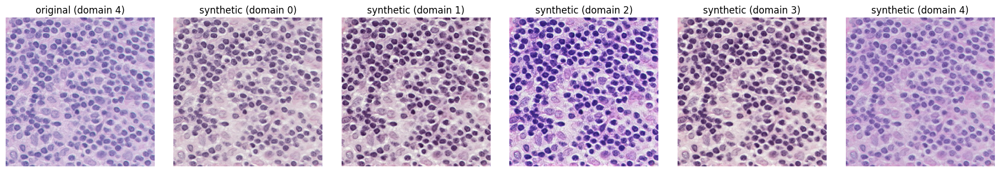

In [54]:
rows, columns, img_size = 1, 6, 3
plt.figure(figsize=(columns * img_size, rows * img_size))

img = torch.load(tiles_dir + tile_names[domain * 5 + img_id]).to(device)
plt.subplot(rows, columns, 1)
plt.imshow(img.permute(1, 2, 0).cpu())
plt.title(f'original (domain {domain})')
plt.axis('off')

z_content = model.enc_c(img.sub(0.5).mul(2).unsqueeze(0))

for i in range(rows * columns - 1):
    out = generate_hist_augs(img, domain, model, z_content, same_attribute=True, new_domain=i, stats=(mean_domains, std_domains), device=device)

    plt.subplot(rows, columns, i + 2)
    plt.imshow(out.add(1).div(2).permute(1, 2, 0).cpu())
    plt.title(f'synthetic (domain {i})')
    plt.axis('off')

plt.tight_layout()

#### 2. Random attribute, discrete domains

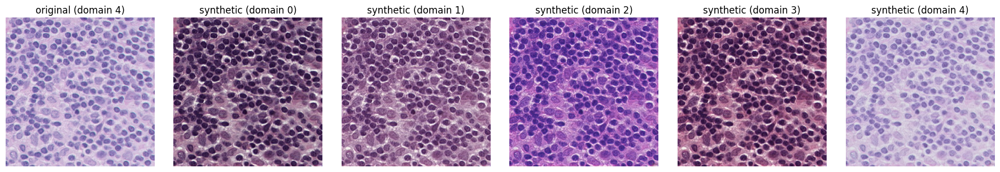

In [57]:
rows, columns, img_size = 1, 6, 3
plt.figure(figsize=(columns * img_size, rows * img_size))

img = torch.load(tiles_dir + tile_names[domain * 5 + img_id]).to(device)
plt.subplot(rows, columns, 1)
plt.imshow(img.permute(1, 2, 0).cpu())
plt.title(f'original (domain {domain})')
plt.axis('off')

z_content = model.enc_c(img.sub(0.5).mul(2).unsqueeze(0))

for i in range(rows * columns - 1):
    out = generate_hist_augs(img, domain, model, z_content, new_domain=i, stats=(mean_domains, std_domains), device=device)

    plt.subplot(rows, columns, i + 2)
    plt.imshow(out.add(1).div(2).permute(1, 2, 0).cpu())
    plt.title(f'synthetic (domain {i})')
    plt.axis('off')

plt.tight_layout()

#### 3. Random attributes, interpolated domains

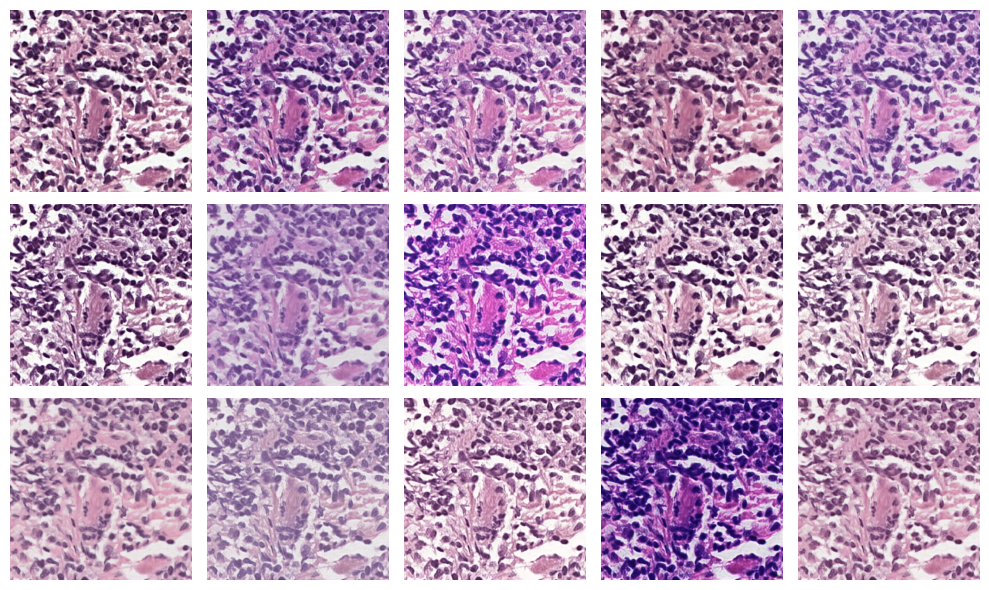

In [42]:
rows, columns, img_size = 3, 5, 2
plt.figure(figsize=(columns * img_size, rows * img_size))

img = torch.load(tiles_dir + tile_names[domain * 5 + img_id]).to(device)
plt.subplot(rows, columns, 1)
plt.imshow(img.permute(1, 2, 0).cpu())
plt.axis('off')

z_content = model.enc_c(img.sub(0.5).mul(2).unsqueeze(0))

for i in range(rows * columns - 1):
    out = generate_hist_augs(img, domain, model, z_content, new_domain=torch.rand(5).unsqueeze(0) * 2 - 0.5, device=device)

    plt.subplot(rows, columns, i + 2)
    plt.imshow(out.add(1).div(2).permute(1, 2, 0).cpu())
    plt.axis('off')

plt.tight_layout()

## Qualitative evaluation by expert pathologist

We checked the quality of HistAuGAN augmentations by an expert pathologist on the structural similarity of original and augmented WSI tiles from the training set, i.e., the Camelyon17 dataset, and an unseen dataset of breast tissue [1].

We define three levels of similarity:

1. High similarity: a pathologist would find it difficult to distinguish the original tile from the augmented tile
2. Moderate similarity: some structural variations are observed, but do not affect pathological diagnosis
3. Low similarity: the augmented tiles cannot be used for diagnostic purposes

In the images below, you can see the paired tiles with the orginal image on the left side and the augmented image on the right side that we used for our qualitative evaluation. The pairs are clustered and framed according to their similarity level evaluated by our expert pathologist.

As shown in the table below, most of the augmented images do not have a structural modification that affects diagnosis and over half of them can even fool an expert pathologist. It is worth to mention that HistAuGAN is not trained on any of the breast cancer images but is still able to transfer its color in a structure-preserving manner.

Tissue Type | High | Mid | Low | Total
--- | --- | --- | --- | ---
Lymph nodes | 10 | 8 | 2 | 20
Breast | 14 | 4 | 2 | 20

### Lymph node tissue (Camelyon17)

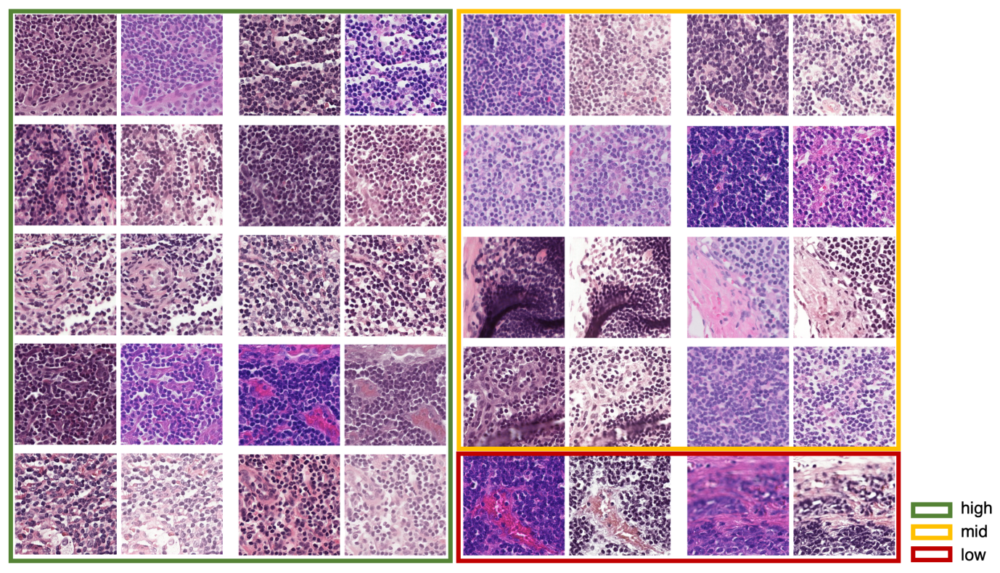

In [45]:
lymph = Image.open('images/qual_eval_lymphnodes.png')
plt.figure(figsize=(20, 10))
plt.imshow(lymph)
plt.axis('off');

### Breast tissue (unseen dataset)

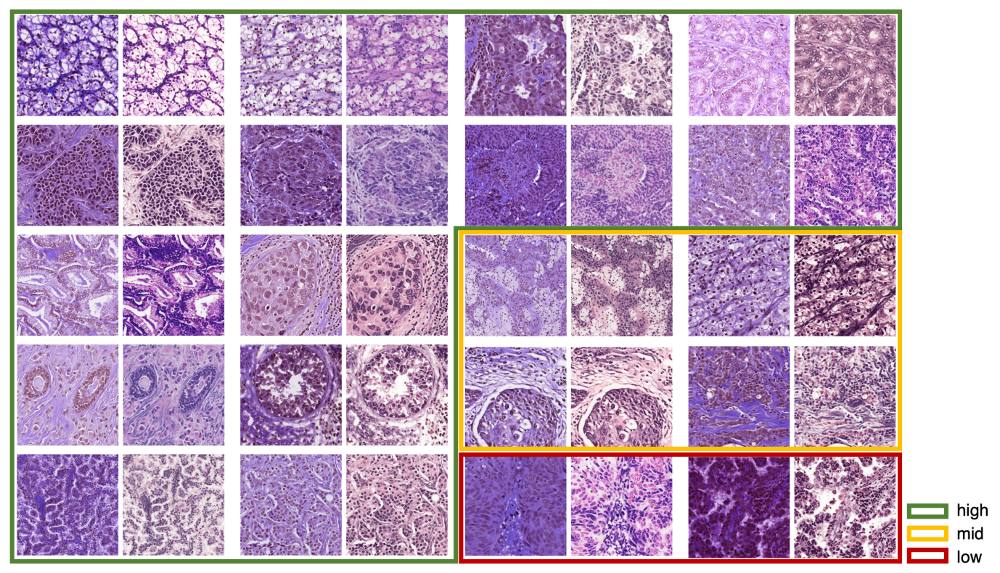

In [69]:
lymph = Image.open('images/qual_eval_breast.png')
plt.figure(figsize=(20, 10))
plt.imshow(lymph)
plt.axis('off');

In [16]:
!pip install tifffile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.5/226.5 kB 20.8 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [19]:
!pip install opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 43.9 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [25]:
# Install the missing library
!apt-get update && apt-get install -y libgl1-mesa-glx

Hit:1 http://deb.debian.org/debian bullseye InRelease
Hit:2 http://deb.debian.org/debian-security bullseye-security InRelease
Hit:3 http://deb.debian.org/debian bullseye-updates InRelease




libgl1-mesa-glx is already the newest version (20.3.5-1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


In [31]:
# After ensuring the library is installed, retry the imports.
import numpy as np
from pathlib import Path
import tifffile
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw
import cv2
import matplotlib.pyplot as plt

import os
import zipfile

In [34]:
import os

target_filename = "MoNuSegTestData (2).zip"

for root, dirs, files in os.walk("/"):
    if target_filename in files:
        full_path = os.path.join(root, target_filename)
        print("✅ Found file at:", full_path)
        break
else:
    print("❌ File not found in storage.")


✅ Found file at: /datasets/_deepnote_work/monuseg_histau/MoNuSegTestData (2).zip


In [37]:
# Path to your zip file in the Google Drive integration
file_path = '/datasets/_deepnote_work/monuseg_histau/MoNuSegTestData (2).zip'

try:
    # First, we need to extract the contents of the zip file
    with zipfile.ZipFile(file_path, 'r') as zip_ref:
        # List the contents of the zip file
        print("Contents of zip file:")
        zip_content = zip_ref.namelist()
        print(zip_content)
        
        # Extract all contents to a directory
        zip_ref.extractall('/tmp/monuseg_extracted')
        
except FileNotFoundError:
    print(f"Error: The file {file_path} was not found. Please check if the file exists and the path is correct.")
except zipfile.BadZipFile:
    print(f"Error: {file_path} is not a valid zip file.")

# Get only image files from zip content
image_files = [f for f in zip_content if f.startswith('MoNuSegTestData/') and f.endswith('.tif')]
extract_path = '/tmp/monuseg_extracted'

Contents of zip file:
['MoNuSegTestData/', 'MoNuSegTestData/TCGA-2Z-A9J9-01A-01-TS1.tif', 'MoNuSegTestData/TCGA-2Z-A9J9-01A-01-TS1.xml', 'MoNuSegTestData/TCGA-44-2665-01B-06-BS6.tif', 'MoNuSegTestData/TCGA-44-2665-01B-06-BS6.xml', 'MoNuSegTestData/TCGA-69-7764-01A-01-TS1.tif', 'MoNuSegTestData/TCGA-69-7764-01A-01-TS1.xml', 'MoNuSegTestData/TCGA-A6-6782-01A-01-BS1.tif', 'MoNuSegTestData/TCGA-A6-6782-01A-01-BS1.xml', 'MoNuSegTestData/TCGA-AC-A2FO-01A-01-TS1.tif', 'MoNuSegTestData/TCGA-AC-A2FO-01A-01-TS1.xml', 'MoNuSegTestData/TCGA-AO-A0J2-01A-01-BSA.tif', 'MoNuSegTestData/TCGA-AO-A0J2-01A-01-BSA.xml', 'MoNuSegTestData/TCGA-CU-A0YN-01A-02-BSB.tif', 'MoNuSegTestData/TCGA-CU-A0YN-01A-02-BSB.xml', 'MoNuSegTestData/TCGA-EJ-A46H-01A-03-TSC.tif', 'MoNuSegTestData/TCGA-EJ-A46H-01A-03-TSC.xml', 'MoNuSegTestData/TCGA-FG-A4MU-01B-01-TS1.tif', 'MoNuSegTestData/TCGA-FG-A4MU-01B-01-TS1.xml', 'MoNuSegTestData/TCGA-GL-6846-01A-01-BS1.tif', 'MoNuSegTestData/TCGA-GL-6846-01A-01-BS1.xml', 'MoNuSegTestData/

In [76]:
print(f"Loading original image {img_id}: {image_files[img_id]}")


Loading original image 0: MoNuSegTestData/TCGA-2Z-A9J9-01A-01-TS1.tif


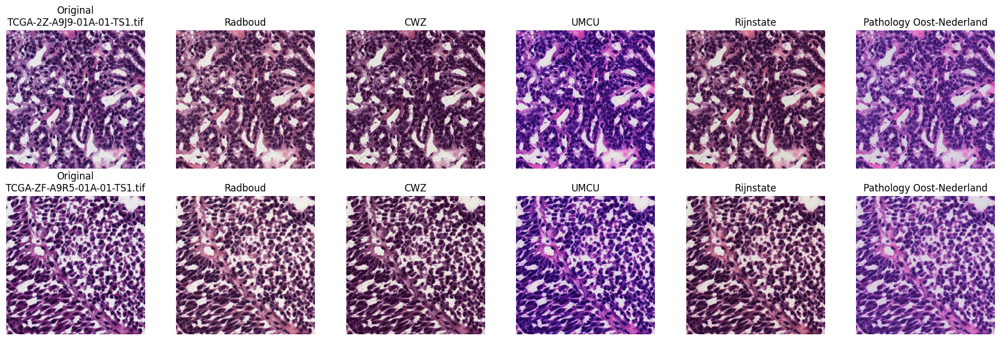

In [43]:
import os
import torch
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

# ==== CONFIGURATION ====
zip_path = '/tmp/monuseg_extracted'  # Root extraction folder
image_files = [f for f in zip_content if f.startswith('MoNuSegTestData/') and f.endswith(('.png', '.jpg', '.tif'))]
img_ids = [0, 13]  # Indices of images to display
source_domain = 4
num_domains = 5
rows, columns, img_size = len(img_ids), 6, 3

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

transform = transforms.Compose([transforms.ToTensor()])

domain_names = ["Radboud", "CWZ", "UMCU", "Rijnstate", "Pathology Oost-Nederland"]

mean_domains = [torch.zeros(3).to(device) for _ in range(num_domains)]
std_domains = [torch.ones(3).to(device) for _ in range(num_domains)]

# ==== Initialize the model ====
# Assuming the model is MD_multi and opts is already defined
from histaugan.model import MD_multi

model = MD_multi(opts)
model.resume(opts.resume, train=False)
model.to(device)
model.eval()

# ==== Prepare output folders ====
output_root = '/tmp/monuseg_augmented'
for domain in domain_names:
    os.makedirs(os.path.join(output_root, domain), exist_ok=True)

# ==== PROCESS ALL IMAGES (save all, no display) ====
for img_id, relative_path in enumerate(image_files):
    img_path = os.path.join(zip_path, relative_path)
    filename = os.path.basename(relative_path)
    
    img = transform(Image.open(img_path)).to(device)
    z_content = model.enc_c(img.sub(0.5).mul(2).unsqueeze(0))

    for domain_idx in range(num_domains):
        out = generate_hist_augs(
            img, source_domain, model, z_content,
            same_attribute=True, new_domain=domain_idx,
            stats=(mean_domains, std_domains),
            device=device
        )

        save_path = os.path.join(output_root, domain_names[domain_idx], filename)
        out_img = transforms.ToPILImage()(out.add(1).div(2).cpu().clamp(0, 1))
        out_img.save(save_path)

# ==== VISUALIZATION: display only selected images ====
plt.figure(figsize=(columns * img_size, rows * img_size))

for row_idx, img_id in enumerate(img_ids):
    relative_path = image_files[img_id]
    img_path = os.path.join(zip_path, relative_path)
    filename = os.path.basename(relative_path)

    img = transform(Image.open(img_path)).to(device)

    # Show original image
    plt.subplot(rows, columns, row_idx * columns + 1)
    plt.imshow(img.permute(1, 2, 0).cpu())
    plt.title(f'Original\n{filename}')
    plt.axis('off')

    # Load and show generated images from saved files
    for domain_idx in range(num_domains):
        saved_img_path = os.path.join(output_root, domain_names[domain_idx], filename)
        saved_img = Image.open(saved_img_path)
        plt.subplot(rows, columns, row_idx * columns + domain_idx + 2)
        plt.imshow(saved_img)
        plt.title(domain_names[domain_idx])
        plt.axis('off')

plt.tight_layout()
plt.show()

In [52]:
import os
import numpy as np
from PIL import Image
import pandas as pd
import torch
import torchvision.transforms as T
import scipy.ndimage as ndi
from tqdm import tqdm

# === Step 1: Helper Functions ===
def get_object_count(mask):
    labeled, num = ndi.label(mask > 0)
    return num

def get_total_area(mask):
    return np.sum(mask > 0)

# Dummy segmentation model (replace with your real model)
def dummy_segmentation(img_tensor):
    # Fake mask: highlight pixels > threshold
    grayscale = img_tensor.mean(dim=1).squeeze(0)
    return (grayscale > 0.7).cpu().numpy().astype(np.uint8)

transform = T.Compose([
    T.ToTensor()
])

selected_domains = ["UMCU", "CWZ"]
img_root = "/tmp/monuseg_augmented"
results = []

for domain in selected_domains:
    domain_path = os.path.join(img_root, domain)
    image_files = [f for f in os.listdir(domain_path) if f.endswith(('.png', '.jpg', '.tif'))]

    for fname in tqdm(image_files, desc=f"Segmenting {domain}"):
        img_path = os.path.join(domain_path, fname)
        img = Image.open(img_path).convert("RGB")
        img_tensor = transform(img).unsqueeze(0)  # shape: [1, 3, H, W]

        # Run your real segmentation model here
        mask = dummy_segmentation(img_tensor)  # Binary or labeled mask

        results.append({
            "domain": domain,
            "image_name": fname,
            "object_count": get_object_count(mask),
            "total_area": get_total_area(mask)
        })

# === Step 3: Save to CSV ===
df = pd.DataFrame(results)
df.to_csv("/work/histaugan_seg_area_umcu_cwz.csv", index=False)
print("✅ Saved stats to /work/histaugan_seg_area_umcu_cwz.csv")


Segmenting CWZ: 100%|██████████| 14/14 [00:00<00:00, 57.25it/s]
✅ Saved stats to /work/histaugan_seg_area_umcu_cwz.csv


In [49]:
mask_root = '/tmp/monuseg_augmented'
selected_domains = ["CWZ", "UMCU"]

for domain in selected_domains:
    domain_mask_path = os.path.join(mask_root, domain)
    print(f"{domain} path: {domain_mask_path}")
    mask_files = [f for f in os.listdir(domain_mask_path) if f.endswith('.npy')]
    print(f"{domain} mask files found: {len(mask_files)}")


CWZ path: /tmp/monuseg_augmented/CWZ
CWZ mask files found: 0
UMCU path: /tmp/monuseg_augmented/UMCU
UMCU mask files found: 0


In [ ]:
import pandas as pd

# Create the DataFrame
df_cellpose = pd.DataFrame({
    'image_index': list(range(len(masks_pred))),
    'object_count': cellpose_counts,
    'total_area': cellpose_areas
})

# Display the DataFrame
print(df_cellpose.head())
# Save the DataFrame to a CSV file in the /work directory
df_cellpose.to_csv('/work/cellpose_seg_area.csv', index=False)

In [100]:
import os
from PIL import Image
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# --- Macenko stain matrix extraction ---
def get_stain_matrix(I, beta=0.15, alpha=1):
    I = I.astype(np.float64) + 1
    OD = -np.log(I / 255)
    ODhat = OD.reshape((-1, 3))
    ODhat = ODhat[~np.any(ODhat < beta, axis=1)]

    _, V = np.linalg.eigh(np.cov(ODhat.T))
    V = V[:, [2, 1]]

    projections = ODhat @ V
    angles = np.arctan2(projections[:, 1], projections[:, 0])

    min_angle, max_angle = np.percentile(angles, [alpha, 100 - alpha])
    v1 = V @ [np.cos(min_angle), np.sin(min_angle)]
    v2 = V @ [np.cos(max_angle), np.sin(max_angle)]

    HE = np.array([v1, v2])
    HE = HE / np.linalg.norm(HE, axis=1)[:, None]
    return HE

# === CONFIGURATION ===
root_dir = '/tmp/monuseg_augmented'
domain_names =  ["Radboud", "CWZ", "UMCU", "Rijnstate", " Oost-Nederland"]

domain_stain_vectors = []

# === PROCESS EACH DOMAIN ===
for domain in domain_names:
    domain_path = os.path.join(root_dir, domain)
    image_files = [f for f in os.listdir(domain_path) if f.endswith(('.tif', '.jpg', '.png'))]

    stain_matrices = []

    for filename in image_files:
        img_path = os.path.join(domain_path, filename)
        img = Image.open(img_path).convert('RGB')
        img_array = np.array(img)
        
        try:
            stain_matrix = get_stain_matrix(img_array)
            stain_matrices.append(stain_matrix)
        except Exception as e:
            print(f"Skipping {filename} due to error: {e}")

    if stain_matrices:
        mean_vector = np.mean(stain_matrices, axis=0).flatten()  # shape (6,)
        domain_stain_vectors.append(mean_vector)
    else:
        print(f"No valid images for domain {domain}")

# === COMPUTE COSINE SIMILARITY ===
similarity_matrix = cosine_similarity(domain_stain_vectors)

# === DISPLAY SIMILARITY MATRIX ===
print("Cosine Similarity Between Domains:")
print("\t" + "\t".join(domain_names))
for i, row in enumerate(similarity_matrix):
    print(f"{domain_names[i]}\t" + "\t".join(f"{sim:.3f}" for sim in row))


FileNotFoundError: [Errno 2] No such file or directory: '/tmp/monuseg_augmented/ Oost-Nederland'

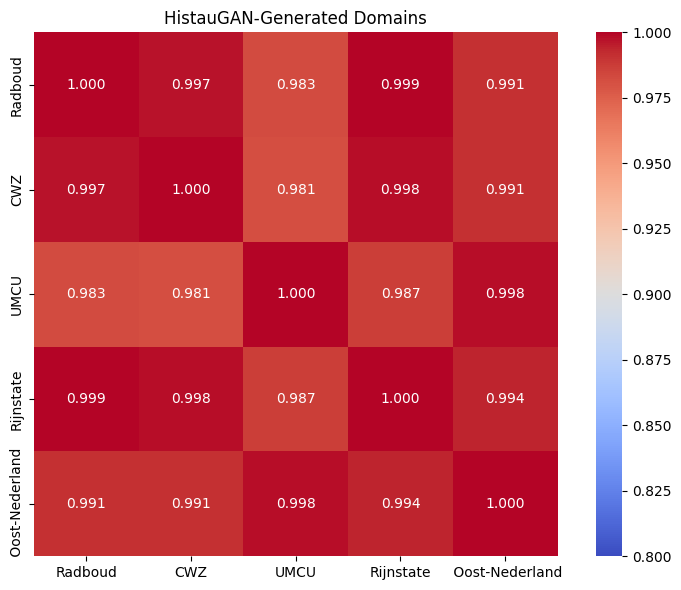

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Create DataFrame for better labeling
similarity_df = pd.DataFrame(similarity_matrix, index=domain_names, columns=domain_names)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(similarity_df, annot=True, fmt=".3f", cmap="coolwarm", vmin=0.8, vmax=1.0, square=True)
plt.title("HistauGAN-Generated Domains")
plt.tight_layout()
plt.show()


In [131]:
import os

output_root = '/tmp/monuseg_augmented'

# List all domain folders
print("Folders:")
for domain in os.listdir(output_root):
    domain_path = os.path.join(output_root, domain)
    if os.path.isdir(domain_path):
        print(f" - {domain}")

# List files inside a domain folder, e.g. 'Radboud'
domain_to_check = 'Radboud'
domain_path = os.path.join(output_root, domain_to_check)
print(f"\nFiles in {domain_to_check}:")
for file in os.listdir(domain_path):
    print(f"  {file}")


Folders:
 - Radboud
 - CWZ
 - UMCU
 - Rijnstate
 - Pathology Oost-Nederland

Files in Radboud:
  TCGA-44-2665-01B-06-BS6.tif
  TCGA-2Z-A9J9-01A-01-TS1.tif
  TCGA-ZF-A9R5-01A-01-TS1.tif
  TCGA-69-7764-01A-01-TS1.tif
  TCGA-A6-6782-01A-01-BS1.tif
  TCGA-AC-A2FO-01A-01-TS1.tif
  TCGA-AO-A0J2-01A-01-BSA.tif
  TCGA-CU-A0YN-01A-02-BSB.tif
  TCGA-EJ-A46H-01A-03-TSC.tif
  TCGA-FG-A4MU-01B-01-TS1.tif
  TCGA-GL-6846-01A-01-BS1.tif
  TCGA-HC-7209-01A-01-TS1.tif
  TCGA-HT-8564-01Z-00-DX1.tif
  TCGA-IZ-8196-01A-01-BS1.tif


In [147]:
import shutil

# Paths
output_root = '/tmp/monuseg_augmented'
zip_path = '/tmp/monuseg_augmented.zip'
final_path = '/work/monuseg_augmented.zip'  # Deepnote's visible area

# Create ZIP
shutil.make_archive(base_name=zip_path.replace('.zip',''), format='zip', root_dir=output_root)

# Move ZIP to /work
shutil.move(zip_path, final_path)

print(f"✅ Ready for download at: {final_path}")



✅ Ready for download at: /work/monuseg_augmented.zip


In [144]:
from IPython.display import FileLink
from IPython.display import HTML

# Correcting the indentation error
HTML(f'<a href="{zip_filename}" download>Click here to download the file</a>')

### References

[1] Roux, L.: Mitos-atypia-14 grand challenge. https://mitos-atypia-14.grand-challenge.org/, accessed: 2021-03-03

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=aec63388-2a81-4781-aedb-c714f974673c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>